Tipul imaginii RGB: uint8


(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x25fd8c6c410>)

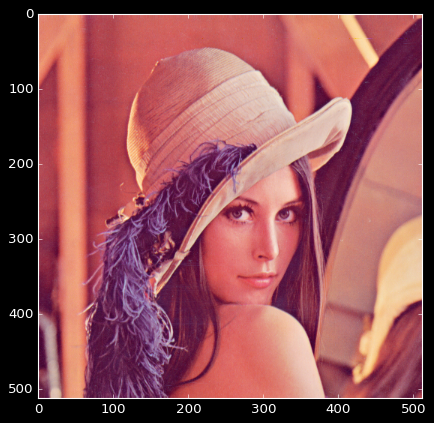

In [45]:
from skimage import io
import matplotlib.pyplot as plt
plt.style.use('dark_background')

IMG_RGB = io.imread('lena.png')
print('Tipul imaginii RGB:', IMG_RGB.dtype)
plt.figure(), plt.imshow(IMG_RGB)

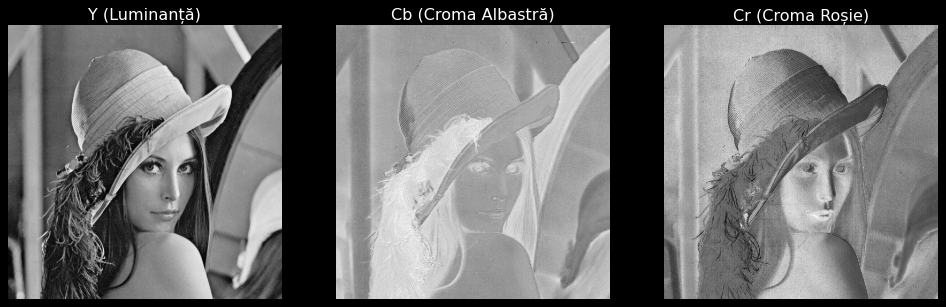

In [46]:
# CONVERSIA LA YCbCr
import numpy as np
from skimage import io, color
import matplotlib.pyplot as plt

image_rgb = io.imread('lena.png')

image_ycbcr = color.rgb2ycbcr(image_rgb)

# 3. Separarea fiecărui plan (canal)
Y_channel = image_ycbcr[:, :, 0]  # Luminanța (Y)
Cb_channel = image_ycbcr[:, :, 1]  # Croma albastră (Cb)
Cr_channel = image_ycbcr[:, :, 2]  # Croma roșie (Cr)

# 4. Afișarea canalelor separat
plt.figure(figsize=(15, 5))

# Afișăm canalul Y (luminanța)
plt.subplot(1, 3, 1)
plt.imshow(Y_channel, cmap='gray')  # Y este afișat corect ca o imagine în tonuri de gri
plt.title("Y (Luminanță)")
plt.axis('off')

# Afișăm canalul Cb (croma albastră)
plt.subplot(1, 3, 2)
plt.imshow(Cb_channel, cmap='gray')  # Cb apare în tonuri de gri, dar reprezintă informație de cromă
plt.title("Cb (Croma Albastră)")
plt.axis('off')

# Afișăm canalul Cr (croma roșie)
plt.subplot(1, 3, 3)
plt.imshow(Cr_channel, cmap='gray')  # Cr apare în tonuri de gri, dar reprezintă informație de cromă
plt.title("Cr (Croma Roșie)")
plt.axis('off')

plt.show()


(256,)


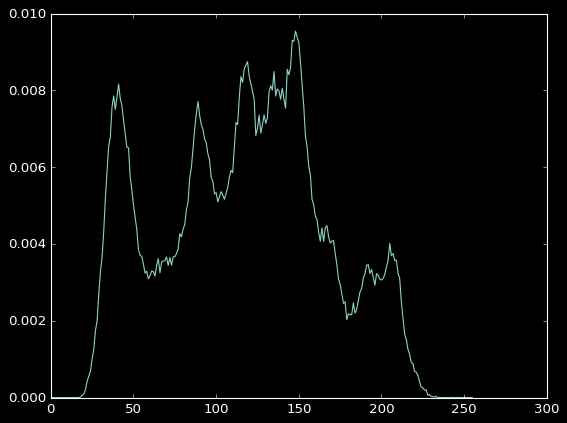

(<Figure size 640x480 with 1 Axes>,
 None)

In [47]:
# HISTOGRAMA
img = io.imread('lena.png')
Yfloat = color.rgb2gray(img)
Y = np.uint8(255 * Yfloat)

hh, _ = np.histogram(Y, 256, (0, 256), density = True) # density True normalizeaza histograma
# Y = matricea de valori pt care se calculeaza histograma
# 256 = numarul de bin-uri
# (0, 256) = Intervalul pentru valorile luate în considerare. Aici, include toată plaja de intensități pentru imagini în tonuri de gri 


print(np.shape(hh))
plt.figure(), plt.plot(hh), plt.show()

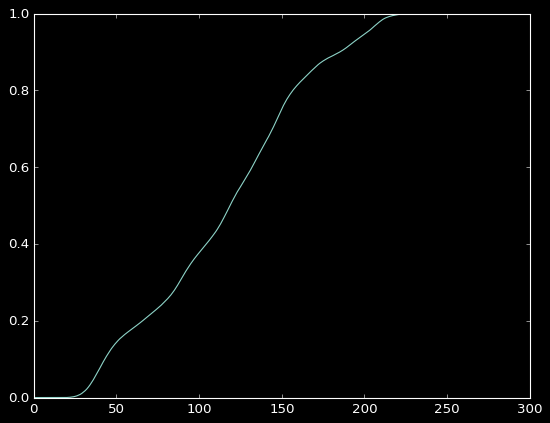

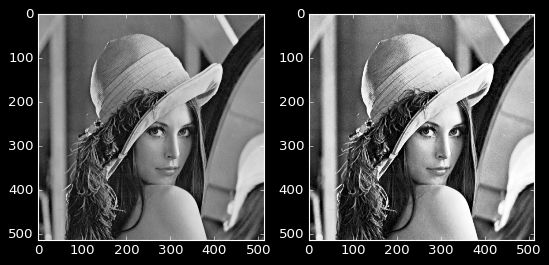

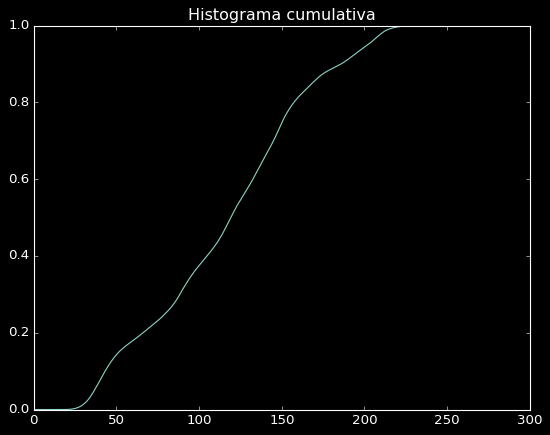

(<Figure size 640x480 with 1 Axes>,
 Text(0.5, 1.0, 'Histograma cumulativa'),
 None)

In [48]:
# HISTOGRAMA
img = io.imread('lena.png')
Yfloat = color.rgb2gray(img)
Y = np.uint8(255 * Yfloat)
hh, _ = np.histogram(Y, 256, (0, 256), density = True)

# HISTOGRAMA CUMULATIVA - se foloseste la egalizarea de histograma
H = np.cumsum(hh)
plt.figure(), plt.plot(H), plt.show()

# EGALIZARE DE HISTOGRAMA
def egalizare_histograma(img):
    Yfloat = color.rgb2gray(img)
    
    h, _ = np.histogram(Yfloat, 256, (0, 1.000000001))
    h = h / np.sum(h)  # ca sa normam la 1
    H = np.cumsum(h)

    [L, C] = np.shape(Yfloat)
    imgout = np.zeros((L, C))

    for l in range(L):
        for c in range(C):
            imgout[l, c] = H[np.uint8(255 * Yfloat[l, c])]
    return imgout, H

img_egalizata, histograma_cumulativa =  egalizare_histograma(img)
plt.subplot(1, 2, 1)
plt.imshow(color.rgb2gray(img), cmap='gray')

plt.subplot(1, 2, 2)
plt.imshow(img_egalizata, cmap='gray')
plt.show()

plt.figure(), plt.plot(histograma_cumulativa), plt.title("Histograma cumulativa"), plt.show()



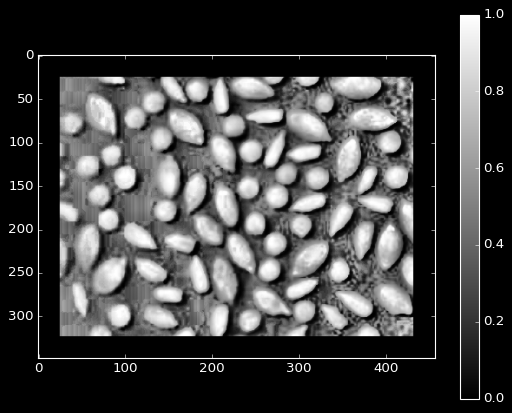

(348, 457)
(398, 507)


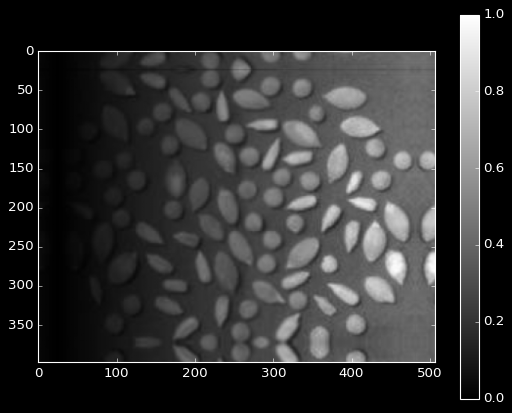

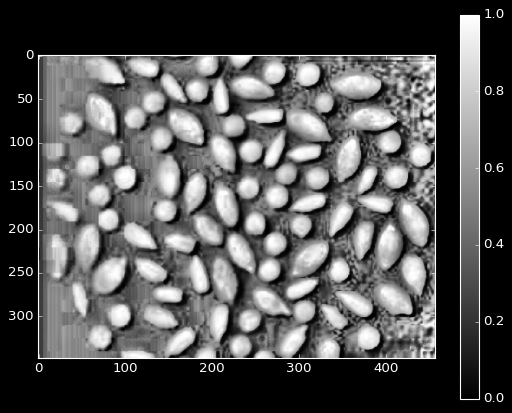

(<Figure size 640x480 with 2 Axes>,
 None)

In [49]:
# Adaptive Histogram Equalization (AHE)
def get_H_HE(img): # calculeaza functia de transfer pentru toata imaginea
    h, _ = np.histogram(img, 256, (0, 1.000000001))
    h = h / np.sum(h)  # ca sa normam la 1
    H = np.cumsum(h)
    return H

img = io.imread('uneven-grain.png')
img = img[:,:, 0] / 255.0 # impartim la 255 ca sa fie in intervalul 0, 1

# adaugam margine neagra
[L, C] = np.shape(img)
img_out = np.zeros((L, C))
W = 25
for l in range(W, L - W):
    for c in range(W, C- W):
        ROI = img[l-W: l+W+1, c-W:c+W+1]# region of interest - pun o fereastra patrata de dimensiune impara, W = dimensiunea lui ROI
        H = get_H_HE(ROI)
        img_out[l, c] = H[np.uint8(255 * img[l, c])]
        
plt.figure(), plt.imshow(img_out, cmap='gray', vmin = 0, vmax = 1), plt.colorbar(), plt.show()

# BORDAREA IMAGINII
from scipy import signal

kernel = np.zeros((2*W+1, 2*W+1))
kernel[W, W] = 1
img_bordata = signal.convolve2d(img, kernel, boundary='symm')

print(np.shape(img))
print(np.shape(img_bordata))

plt.figure(), plt.imshow(img_bordata, cmap='gray', vmin = 0, vmax = 1), plt.colorbar(), plt.show()

# EGALIZAREA DE HISTOGRAMA ADAPTIVA
img_egalizata = np.zeros((L, C))
for l in range(0, L):
    for c in range(0, C):
        ROI = img_bordata[l-W+W: l+W+W+1, c-W+W:c+W+W+1]
        H = get_H_HE(ROI)
        img_egalizata[l, c] = H[np.uint8(255 * img[l, c])]
        
plt.figure(), plt.imshow(img_egalizata, cmap='gray', vmin = 0, vmax = 1), plt.colorbar(), plt.show()

In [164]:
import numpy as np
from scipy import ndimage

# Funcție pentru aplicarea unui filtru Gaussian -> efect de blur
def apply_gaussian_filter(img, sigma=1): # functie laura
    # Conversia imaginii în grayscale
    Y = color.rgb2gray(img)

    # Aplicarea filtrului Gaussian
    Y_smooth = ndimage.gaussian_filter(Y, sigma=sigma)

    # Afișarea rezultatelor
    plt.figure(), plt.imshow(img), plt.title("Imaginea originală"), plt.axis("off"), plt.show()
    plt.figure(), plt.imshow(Y, cmap='gray'), plt.title("Imaginea grayscale"), plt.colorbar(), plt.show()
    plt.figure(), plt.imshow(Y_smooth, cmap='gray'), plt.title(f"Imaginea netezită - Gaussian (sigma={sigma})"), plt.colorbar(), plt.show()

    return Y_smooth

# Funcție generică pentru adăugarea de zgomot gaussian
# def add_gaussian_noise(img, std_dev):
#     if img.dtype == np.uint8:
#         img = img.astype(np.float32) / 255.0  # Normalize to [0, 1]
#     noise = np.random.normal(0, std_dev, img.shape)
#     img_out = img + noise
#     img_out = np.clip(img_out, 0, 1)  # Clip to [0, 1]
#     return (img_out * 255).astype(np.uint8)

# add gaussian noise to a color image

def add_gaussian_noise(img, disp): # functie marian
      
   zg = np.random.normal(0,disp,np.shape(img))
   img_zg = img + zg
   # e posibil ca unele valori sa iasa din gama [0,255]
   img_zg = np.clip(img_zg, a_min = 0, a_max =255)
   
   return np.uint8(img_zg)

# Funcție generică pentru adăugarea de zgomot impulsiv
def add_impulsive_noise(img, p0, p255):
    if img.dtype == np.uint8:  # Verificăm dacă imaginea este uint8
        img = img.astype(np.float32) / 255.0  # Normalizăm imaginea la intervalul [0, 1]
    
    h, w, c = img.shape
    img_out = img.copy()
    
    # Calculăm numărul de pixeli zgomotoși
    nr_px_0 = int(np.floor(p0 * h * w))
    nr_px_255 = int(np.floor(p255 * h * w))
    
    # Generăm coordonate unice pentru zgomotul impulsiv
    coords_0 = (np.random.randint(0, h, nr_px_0), np.random.randint(0, w, nr_px_0))
    coords_255 = (np.random.randint(0, h, nr_px_255), np.random.randint(0, w, nr_px_255))
    
    # Setăm pixelii la negru (0) sau alb (255)
    img_out[coords_0[0], coords_0[1], :] = 0
    img_out[coords_255[0], coords_255[1], :] = 1  # 1 pentru imagine normalizată
    
    # Convertim înapoi la uint8
    return (img_out * 255).astype(np.uint8)

def add_impulsive_noise2(img,p0,p1):
    if (np.max(img)>1):
        img = img/255.0
    [L,C,pl]=np.shape(img)
    Nrpix0 = int(L*C*p0)
    Nrpix1 = int(L*C*p1)
    
    for plan_curent in range(0,pl):
        numere_intregiL = np.random.randint(0,L,[Nrpix0])
        numere_intregiC = np.random.randint(0,C,[Nrpix0])
        img[numere_intregiL,numere_intregiC,plan_curent]=0
        numere_intregiL = np.random.randint(0,L,[Nrpix1])
        numere_intregiC = np.random.randint(0,C,[Nrpix1])
        img[numere_intregiL,numere_intregiC,plan_curent]=1
    
    return img


In [165]:
# calculare METRICI DE CALITATE
def mse(img0, img): # img0 e imagiena de referinta
    if np.max(img) > 1:
        img = img / 255.0
    if np.max(img0) > 1:
        img0 = img0 / 255.0
    MSE = np.sum((img-img0)**2) / np.prod(np.shape(img))
    sumval = np.sum(img0**2) / np.prod(np.shape(img))
    NMSE = MSE / sumval
    return MSE, NMSE

In [ ]:
# FILTRARE LINIARA - GENERIC PENTRU MA si MAP
def filtrare_liniara(img, nucleu):
    if np.max(img) > 1:
        img = img / 255.0
    nucleu = nucleu / np.sum(nucleu)
    [d1, d2] = np.shape(nucleu)
    W = d1//2
    
    kernel = np.zeros((2*W+1, 2*W+1))
    kernel[W, W] = 1
    [L,C, nrplane] = np.shape(img)
    imgout = np.zeros(np.shape(img))
    
    for pl in range(0, 3):
        imgout[:,:,pl] = signal.convolve2d(img[:,:,pl], nucleu, mode='same', boundary='symm') # e la fel pt ca face bordarea implicit
                
    return imgout


# def mediere_aritmetica(img, dim_fereastra):
#     if img.dtype == np.uint8:  # Normalizăm imaginea dacă e în intervalul 0-255
#         img = img.astype(np.float32) / 255.0
#     
#     # Creăm o fereastră pentru filtrul mediei
#     kernel = np.ones((dim_fereastra, dim_fereastra)) / (dim_fereastra ** 2)
#     
#     # Aplicăm filtrul separat pe fiecare canal
#     img_out = np.zeros_like(img, dtype=np.float32)
#     for channel in range(img.shape[2]):
#         img_out[:, :, channel] = signal.convolve2d(
#             img[:, :, channel], kernel, boundary='symm', mode='same'
#         )
#     
#     # Convertim înapoi la uint8
#     return (np.clip(img_out, 0, 1) * 255).astype(np.uint8)

# def mediere_aritmetica(img, dim_fereastra):
#     h, w, c = img.shape
#     img_out = np.zeros_like(img, dtype=np.uint8)
#     offset = dim_fereastra // 2
#     for y in range(offset, h - offset):
#         for x in range(offset, w - offset):
#             for channel in range(c):
#                 patch = img[y - offset:y + offset + 1, x - offset:x + offset + 1, channel]
#                 img_out[y, x, channel] = np.mean(patch)
#     return img_out

# filtru gaussian normal (de comparat)

def mediere_aritmetica(img, cv):
    nucleu = np.ones((8,8))/64.0
    [d1, d2] = np.shape(nucleu)
    kernel = np.zeros((d1+1, d2+1))
    kernel[d1//2,d2//2] = 1

    [L,C,pl] = np.shape(img)
    imgout = np.zeros((L,C,pl))

    for pl in range(0,3):
        Ybordered = signal.convolve2d(img[:,:,pl], kernel, mode='full', boundary='symm')
        for l in range(0,L):
            for c in range(0,C):
                imgout[l,c,pl] = np.sum(nucleu*Ybordered[l:l+d1, c:c+d2])

    return np.uint8(imgout)


def median_filter(img, dim_fereastra):
    h, w, c = img.shape
    img_out = np.zeros_like(img, dtype=np.uint8)
    offset = dim_fereastra // 2

    # Iterăm peste fiecare pixel (fără margini)
    for y in range(offset, h - offset):
        for x in range(offset, w - offset):
            for channel in range(c):
                # Extragem fereastra din jurul pixelului curent
                patch = img[y - offset:y + offset + 1, x - offset:x + offset + 1, channel]
                # Calculăm valoarea mediană
                img_out[y, x, channel] = np.median(patch)

    return img_out

img = io.imread("lena.png")

# Adăugare zgomot impulsiv
img_impulsiv = add_impulsive_noise(img, 0.05, 0.05)

# Adăugare zgomot gaussian
# img_gaussian = add_gaussian_noise(img, 0.5)
img_gaussian = add_gaussian_noise(img, 40)

# Aplicare filtru medie aritmetică
img_impulsiv_filtrat_MA = mediere_aritmetica(img_impulsiv, 3)
img_gaussian_filtrat_MA = mediere_aritmetica(img_gaussian, 3)

# Aplicare filtru median
img_impulsiv_filtrat_median = median_filter(img_impulsiv, 3)
img_gaussian_filtrat_median = median_filter(img_gaussian, 3)

# Afișare imagini
plt.figure(figsize=(15, 10))

plt.subplot(1, 4, 1)
plt.title("Imagine originală")
plt.imshow(img)
plt.axis("off")

plt.subplot(1, 4, 2)
plt.title("Zgomot impulsiv")
plt.imshow(img_impulsiv)
plt.axis("off")

plt.subplot(1, 4, 3)
plt.title("Filtrare - Medie Aritmetică")
plt.imshow(img_impulsiv_filtrat_MA)
plt.axis("off")

plt.subplot(1, 4, 4)
plt.title("Filtrare - Median")
plt.imshow(img_impulsiv_filtrat_median)
plt.axis("off")

plt.tight_layout()
plt.show()
########################################
plt.figure(figsize=(15, 10))
plt.subplot(1, 4, 1)
plt.title("Imagine originală")
plt.imshow(img)
plt.axis("off")

plt.subplot(1, 4, 2)
plt.title("Zgomot gaussian")
plt.imshow(img_gaussian)
plt.axis("off")

plt.subplot(1, 4, 3)
plt.title("Filtrare - Medie Aritmetică")
plt.imshow(img_gaussian_filtrat_MA)
plt.axis("off")

plt.subplot(1, 4, 4)
plt.title("Filtrare - Median")
plt.imshow(img_gaussian_filtrat_median)
plt.axis("off")

plt.tight_layout()
plt.show()



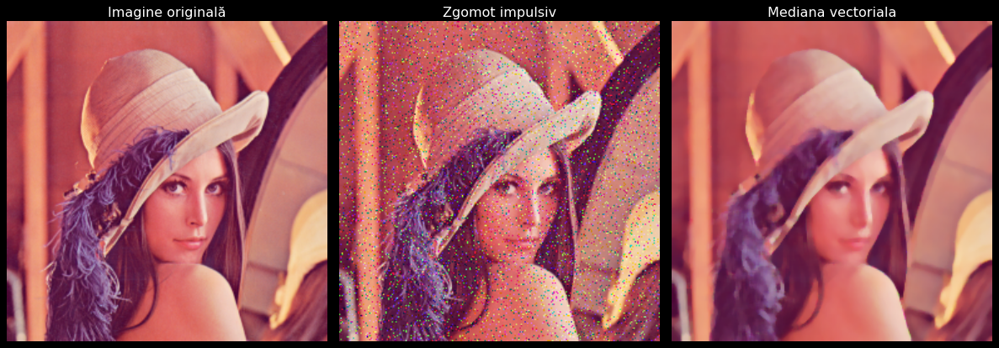

In [53]:
# FILTRAREA CU MEDIANA VECTORIALA
def median_scalar(img, dim):
    if(np.max(img)>1):
        img = img/255.0
    [L,C] = np.shape(img)
    kernel = np.zeros((dim, dim))
    poz_median = dim*dim//2
    W = dim//2
    kernel[W,W] = 1
    Ybordat = signal.convolve2d(img, kernel, mode='full', boundary = 'symm')
    imgout = np.zeros((L,C))
    for l in range (0, L):
        for c in range (0, C):
            #selecteaza valori conform ferestri plasate (l,c)
            val_selectate = Ybordat[l-W+W:l+W+1+W, c-W+W:c+W+1+W]
            #combina valorile selectate
            val_sortate = np.sort(np.ndarray.flatten(val_selectate))
            #scrie rezultatul in imgout[l,c]
            imgout[l,c]=val_sortate[poz_median]
    return imgout

def median_marginal(img, dim):
    if(np.max(img)>1):
        img = img/255.0
    [L,C,pl] = np.shape(img)
    imgout = np.zeros((L,C,pl))
    for p in range (0, pl):
        imgout[:,:,p] = median_scalar(img[:,:,p], dim)

    return imgout

img = io.imread("lenamic.png")

plt.figure(figsize=(15, 10))
plt.subplot(1, 3, 1), plt.title("Imagine originală"), plt.imshow(img), plt.axis("off")

img = img[:,:,0:3]
imgzg = add_impulsive_noise2(img, 0.03,0.03)
plt.subplot(1, 3, 2), plt.title("Zgomot impulsiv"), plt.imshow(imgzg), plt.axis("off")

img_median_marginal = median_marginal(imgzg,5)
plt.subplot(1, 3, 3), plt.title("Mediana vectoriala"), plt.imshow(img_median_marginal), plt.axis("off")

plt.tight_layout()
plt.show()


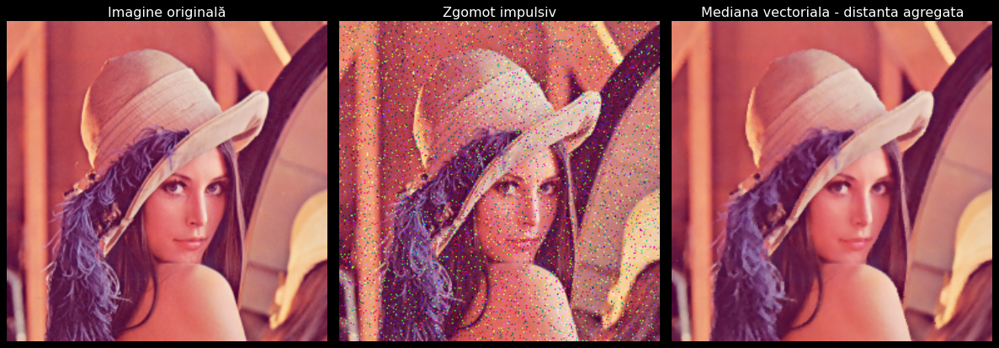

In [54]:
# FILTRU MEDIAN VECTORIAL OBTINUT PRIN ABORDAREA "DISTANTA AGREGATA"

def median_vectorial_dist_agregata(img, dim):
    if(np.max(img)>1):
        img = img/255.0
    [L,C,pl] = np.shape(img)
    kernel = np.zeros((dim, dim))
    poz_median = dim*dim//2
    W = dim//2
    kernel[W,W] = 1
    Ybordat = np.zeros((L+dim-1, C+dim-1, pl))
    for p in range (0,pl):
        Ybordat[:, :, p] = signal.convolve2d(img[:,:,p], kernel, mode='full', boundary = 'symm')

    MM = median_marginal(img, dim)

    #TEMA: schimbare median_marginal in media aritmetica ca punct de referinta + de facut diferenta
    imgout = np.zeros((L,C,pl))
    for l in range (0, L):
        for c in range (0, C):
            #selecteaza valori conform ferestri plasate (l,c)
            val_selectate = Ybordat[l-W+W:l+W+1+W, c-W+W:c+W+1+W, :]
            #combina valorile selectate
            
            #calculez distanta de la fiecare culoare din val_selectate 
            #la toate celelalte culori din val_selectate si sumez aceste distante
            dist = np.zeros((dim,dim))
            for i in range(0, dim):
                for j in range(0, dim):
                    vector_curent = val_selectate[i,j,:]
                    dist[i,j] = np.sum(np.sum(np.abs(val_selectate - vector_curent),axis=2))
            #aflam pe care pozitie din vecinatate se gaseste distanta minima
            pos = np.argmin(dist)
            pos_linie = pos//dim
            pos_col = pos%dim
            #scrie rezultatul in imgout[l,c]
            imgout[l,c,:]=val_selectate[pos_linie, pos_col,:]
    return imgout

img = io.imread("lenamic.png")

plt.figure(figsize=(15, 10))
plt.subplot(1, 3, 1), plt.title("Imagine originală"), plt.imshow(img), plt.axis("off")
img = img[:,:,0:3]

imgzg = add_impulsive_noise2(img, 0.03,0.03)
plt.subplot(1, 3, 2), plt.title("Zgomot impulsiv"), plt.imshow(imgzg), plt.axis("off")

imgrez_dist_agg = median_vectorial_dist_agregata(imgzg, 3)
plt.subplot(1, 3, 3), plt.title("Mediana vectoriala - distanta agregata"), plt.imshow(imgrez_dist_agg), plt.axis("off")

plt.tight_layout()
plt.show()

In [55]:
# FILTRU MEDIAN VECTORIAL OBTINUT PRIN ABORDAREA "UNGHIULARA"
# TO DO? nu s-a facut in clasa

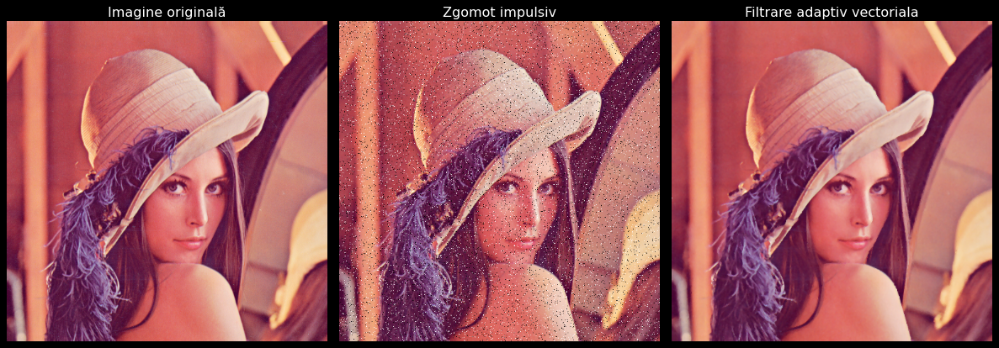

In [56]:
# FILTRU ADAPTIV VECTORIAL OBTINUT PRIN ABORDAREA "DISTANTA"

def adaptiv_dist_la_mm(img, dim, r):
    if np.max(img) > 1:
        img = img / 255.0  # Normalize to [0, 1]
    
    [L, C, pl] = np.shape(img)
    kernel = np.zeros((dim, dim))
    W = dim // 2
    kernel[W, W] = 1  # Center pixel
    
    # Pad the image and compute median marginal
    Ybordat = np.zeros((L + dim - 1, C + dim - 1, pl))
    for p in range(pl):
        Ybordat[:, :, p] = signal.convolve2d(img[:, :, p], kernel, mode='full', boundary='symm')
    
    MM = median_marginal(img, dim)  # Median marginal for each pixel
    imgout = np.zeros((L, C, pl))
    
    # Iterate over each pixel
    for l in range(L):
        for c in range(C):
            # Extract the window around the current pixel
            val_selectate = Ybordat[l:l + dim, c:c + dim, :]
            
            # Compute the distance from the median marginal
            dist = np.sum((val_selectate - MM[l, c, :]) ** 2, axis=2)
            
            # Handle zero distances (replace them with a large value temporarily)
            dist[dist == 0] = np.inf
            
            # Compute weights based on distance and scalar `r`
            a = (1 / dist) ** r
            a[dist == np.inf] = 1  # Assign full weight to zero-distance values
            w = a / np.sum(a)  # Normalize weights
            
            # Compute the output pixel by combining weighted values
            for plan in range(pl):
                imgout[l, c, plan] = np.sum(w * val_selectate[:, :, plan])
    
    return np.clip(imgout, 0, 1)  # Ensure values stay in [0, 1]

img = io.imread('lena.png')
img = img[:, :, 0:3]
plt.figure(figsize=(15, 10))
plt.subplot(1, 3, 1)
plt.title("Imagine originală"), plt.imshow(img), plt.axis("off")

imgzg = add_impulsive_noise(img, 0.03,0.03)
plt.subplot(1, 3, 2), plt.title("Zgomot impulsiv"), plt.imshow(imgzg), plt.axis("off")

img_rez_adaptiv = adaptiv_dist_la_mm(imgzg, 3, 1)
plt.subplot(1, 3, 3), plt.title("Filtrare adaptiv vectoriala"), plt.imshow(img_rez_adaptiv), plt.axis("off")

plt.tight_layout()
plt.show()




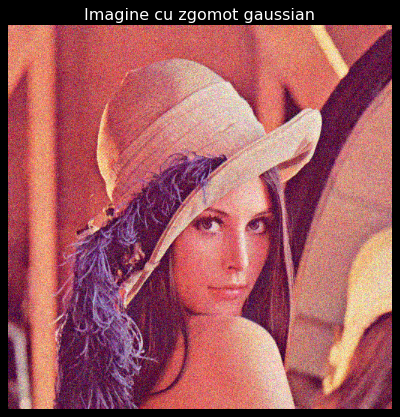

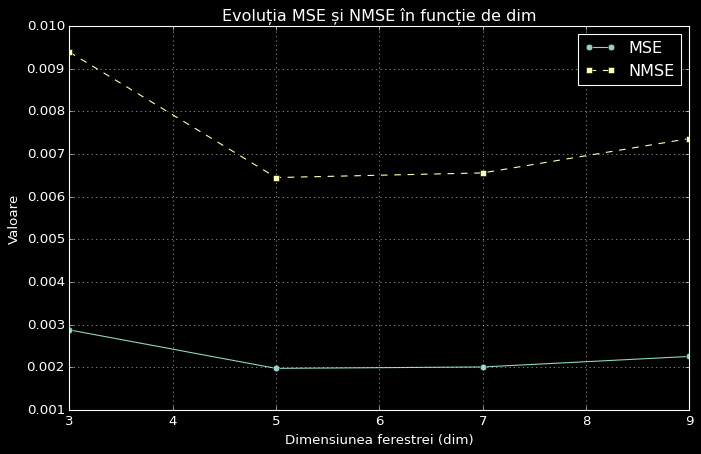

In [57]:
# GRAFIC AL DEPENDENTEI UNEI MASURI DE CALITATE A IMAGINII FILTRARE DE R
# RESPECTIV DE PUTEREA DE ZGOMOT

img = io.imread('lena.png')
img = img[:, :, 0:3] / 255.0  # Normalizează imaginea
imgzg = add_gaussian_noise(img, 0.1)  # Adaugă zgomot gaussian

plt.figure()
plt.imshow(imgzg)
plt.title("Imagine cu zgomot gaussian")
plt.axis("off")
plt.show()

# Inițializarea vectorilor pentru MSE și NMSE
mse_ = np.zeros(4)
nmse_ = np.zeros(4)

# Filtrare adaptivă și calculul MSE și NMSE
for idx, dim in enumerate(range(3, 10, 2)):
    imout = adaptiv_dist_la_mm(imgzg, dim, 2)
    imout = np.clip(imout, 0, 1)  # Asigură-te că valorile sunt valide
    mse_[idx], nmse_[idx] = mse(img, imout)  # Descompunem tuple-ul în două valori

# Afișare grafic MSE și NMSE
plt.figure(figsize=(10, 6))
plt.plot(range(3, 10, 2), mse_, marker='o', label='MSE')
plt.plot(range(3, 10, 2), nmse_, marker='s', label='NMSE', linestyle='--')
plt.xlabel('Dimensiunea ferestrei (dim)')
plt.ylabel('Valoare')
plt.title('Evoluția MSE și NMSE în funcție de dim')
plt.legend()
plt.grid()
plt.show()

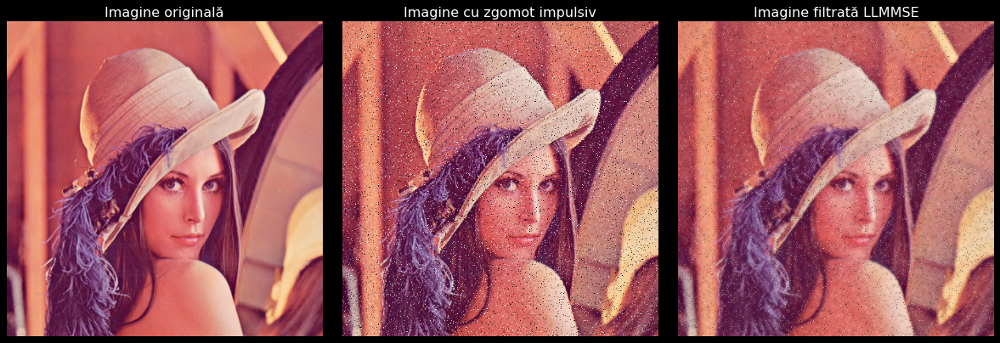

In [58]:
# FILTRU VECTORIAL LLMMSE
# asta a fost ca tema de terminat
import numpy as np
from scipy import signal

def adaptiv_llmmse(img, dim, r):
    if np.max(img) > 1:
        img = img / 255.0  # Normalizam la [0, 1]
    
    [L, C, pl] = np.shape(img)
    W = dim // 2  
    kernel = np.ones((dim, dim)) / (dim * dim)  # nucleu uniform

    # media marginală
    MM = np.zeros((L, C, pl))
    for p in range(pl):
        MM[:, :, p] = signal.convolve2d(img[:, :, p], kernel, mode='same', boundary='symm')

    Ybordat = np.zeros((L + dim - 1, C + dim - 1, pl))
    for p in range(pl):
        Ybordat[:, :, p] = np.pad(img[:, :, p], W, mode='symmetric')

    imgout = np.zeros((L, C, pl))

    # iteram fiecare pixel
    for l in range(L):
        for c in range(C):
            # extragem fereastra pentru pixelul curent (dim x dim x pl)
            val_selectate = Ybordat[l:l + dim, c:c + dim, :]  #  (dim, dim, pl)
            
            Kf = np.zeros((pl, pl)) 
            for i in range(pl):
                for j in range(pl):
                    Kf[i, j] = np.mean(
                        (val_selectate[:, :, i] - np.mean(val_selectate[:, :, i])) *
                        (val_selectate[:, :, j] - np.mean(val_selectate[:, :, j]))
                    )

            var_f = np.trace(Kf) / pl  # Variance of the signal
            
            # varianta de zgomot
            var_z = np.mean([
                np.var(val_selectate[:, :, i] - MM[l, c, i]) for i in range(pl)
            ])

            # (weight for LLMMSE)
            alpha = var_z / (var_f + var_z)

            for p in range(pl):
                imgout[l, c, p] = alpha * MM[l, c, p] + (1 - alpha) * img[l, c, p]

    return np.clip(imgout, 0, 1)


img = io.imread('lena.png')[:, :, :3] / 255.0
imgzg = add_impulsive_noise(img, 0.03, 0.03) 

filtered_img = adaptiv_llmmse(imgzg, dim=7, r=2) # fereaestra de 3 era cam mica

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title("Imagine originală")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(imgzg)
plt.title("Imagine cu zgomot impulsiv")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(filtered_img)
plt.title("Imagine filtrată LLMMSE")
plt.axis("off")

plt.tight_layout()
plt.show()



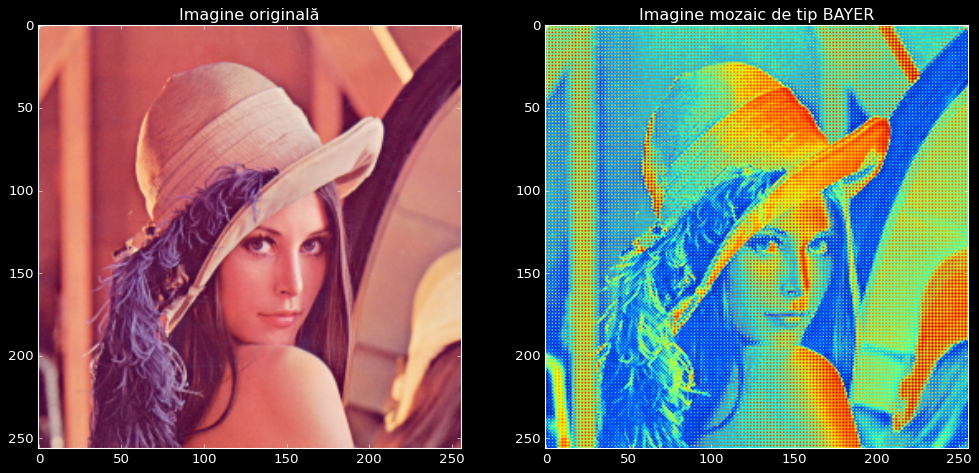

In [89]:
# LAB 9
# IMAGINE RGB --> IMAGINE MOZAIC DE TIP BAYER
def rgb2bayer(img):
    # se returneaza o matrice cu aceleasi dimensiuni ca ale lui img
    L, C, _ = np.shape(img)
    imgout = np.zeros((L, C))
    #window = np.ndarray[[[1,0,0],[0,1,0]],[[0,1,0],[0,0,1]]]
    for l in range(0, L):
        for c in range(0, C):
            if (l % 2 == 0 and c % 2 == 0):
                imgout[l, c] = img[l, c, 0]
            elif (l % 2 == 1 and c % 2 == 1):
                imgout[l, c] = img[l, c, 2]
            else:
                imgout[l, c] = img[l, c, 1]
    return imgout

img = io.imread('lenamic.png')
img_bayer = rgb2bayer(img)

plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Imagine originală")

plt.subplot(1, 2, 2)
plt.imshow(img_bayer)
plt.title("Imagine mozaic de tip BAYER")

plt.show()

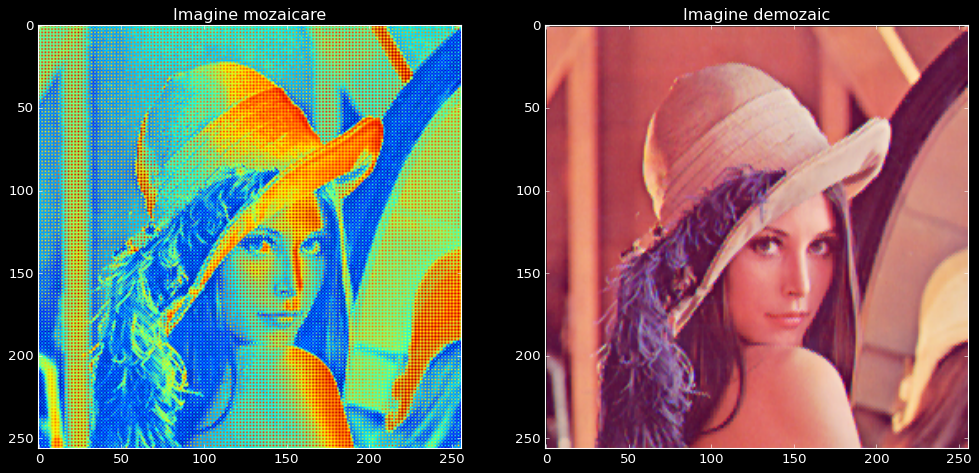

In [73]:
# DEMOZAICARE dupa procedura de interpolare de ordin 0

# bordez imaginea
# aplic demozaicarea conform CFA
def demozaic0(mozaic):
    # if (np.max(img)>1):
    #     img = img/255.0
        
    L,C = np.shape(mozaic)
    img_bordat = np.zeros((L+1,C+1))
    img_bordat[1:L+1,1:C+1] = mozaic[:,:]
    img_bordat[0,1:C+1]     = mozaic[1,:]
    img_bordat[1:L+1,0]     = mozaic[:,1]
    img_bordat[0,0]         = mozaic[1,1]
     
    rgb = np.zeros((L,C,3))

    for l in range(1,L):
        for c in range(1,C):
            if (l%2==0):
                if (c%2==0):
                    rgb[l,c,0]=mozaic[l,c]
                    rgb[l,c,1]=mozaic[l-1,c]
                    rgb[l,c,2]=mozaic[l-1,c-1]
                else:
                    rgb[l,c,0]=mozaic[l,c-1]
                    rgb[l,c,1]=mozaic[l,c]
                    rgb[l,c,2]=mozaic[l-1,c]
            else:
                if (c%2==0):
                    rgb[l,c,0]=mozaic[l-1,c]
                    rgb[l,c,1]=mozaic[l,c]
                    rgb[l,c,2]=mozaic[l,c-1]
                else:
                    rgb[l,c,0]=mozaic[l-1,c-1]
                    rgb[l,c,1]=mozaic[l-1,c]
                    rgb[l,c,2]=mozaic[l,c]
    return rgb

img_mozaicare = rgb2bayer(img)
img_demozaic0 = np.uint8(demozaic0(img_mozaicare))

plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
plt.imshow(img_mozaicare)
plt.title("Imagine mozaicare")

plt.subplot(1, 2, 2)
plt.imshow(img_demozaic0)
plt.title("Imagine demozaic - interpolare de ordin 0")

plt.show()

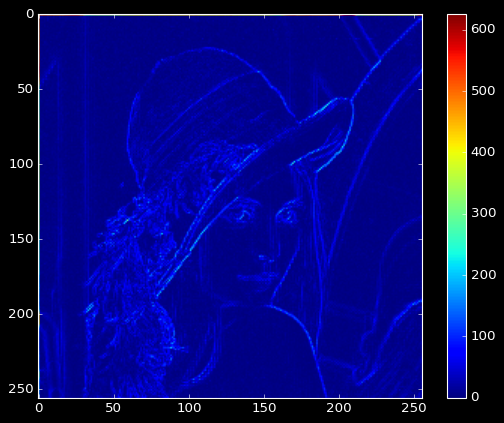

(<Figure size 640x480 with 2 Axes>,
 None)

In [74]:
# imagine de diferenta

# trecem la float ca sa nu se dea peste cap la diferenta (pt uint8)
diff = np.float64(img_demozaic0) - np.float64(img[:,:,0:3])
## SAU
#diff = img/255.0 - x/255.0

# diferenta cumulata
diffcum = np.sum(np.abs(diff), axis = 2)
plt.figure(), plt.imshow(diffcum), plt.colorbar(), plt.show()

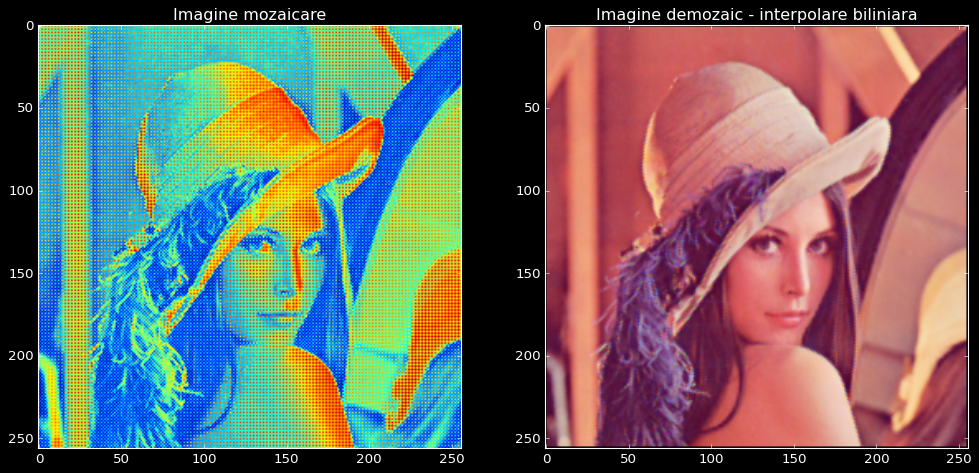

In [81]:
# DEMOZAICARE dupa procedura de interpolare biliniara

# doar canalul de verde
# def demozaic_biliniar(mozaic):
#     if np.max(mozaic) > 1:
#         mozaic = mozaic / 255.0
# 
#     L, C = np.shape(mozaic)
#     rgb = np.zeros((L, C, 3))
# 
#     for l in range(L):  # Loop through rows
#         for c in range(C):  # Loop through columns
#             if l == 0 or l == L - 1 or c == 0 or c == C - 1:
#                 # Skip edges or apply specific handling for boundaries
#                 rgb[l, c, 1] = mozaic[l, c]
#             else:
#                 # Handle inner pixels with bilinear interpolation
#                 if l % 2 == 1 and c % 2 == 1:  # Green pixel
#                     rgb[l, c, 1] = (mozaic[l - 1, c] + mozaic[l + 1, c] + mozaic[l, c - 1] + mozaic[l, c + 1]) / 4
#                 elif l % 2 == 0 and c % 2 == 0:  # Another green pixel
#                     rgb[l, c, 1] = (mozaic[l - 1, c] + mozaic[l + 1, c] + mozaic[l, c - 1] + mozaic[l, c + 1]) / 4
# 
#     return rgb

def demozaic_biliniar(mozaic):
    if np.max(mozaic) > 1:
        mozaic = mozaic / 255.0

    L, C = np.shape(mozaic)
    rgb = np.zeros((L, C, 3))

    for l in range(1, L - 1):  # Evită marginile
        for c in range(1, C - 1):  # Evită marginile
            if l % 2 == 0 and c % 2 == 0:  # Pixel roșu
                rgb[l, c, 0] = mozaic[l, c]
                rgb[l, c, 1] = (mozaic[l - 1, c] + mozaic[l + 1, c] + mozaic[l, c - 1] + mozaic[l, c + 1]) / 4
                rgb[l, c, 2] = (mozaic[l - 1, c - 1] + mozaic[l - 1, c + 1] +
                                mozaic[l + 1, c - 1] + mozaic[l + 1, c + 1]) / 4
            elif l % 2 == 1 and c % 2 == 1:  # Pixel albastru
                rgb[l, c, 2] = mozaic[l, c]
                rgb[l, c, 1] = (mozaic[l - 1, c] + mozaic[l + 1, c] + mozaic[l, c - 1] + mozaic[l, c + 1]) / 4
                rgb[l, c, 0] = (mozaic[l - 1, c - 1] + mozaic[l - 1, c + 1] +
                                mozaic[l + 1, c - 1] + mozaic[l + 1, c + 1]) / 4
            else:  # Pixel verde
                rgb[l, c, 1] = mozaic[l, c]
                if l % 2 == 0:  # Verde pe rândurile pare
                    rgb[l, c, 0] = (mozaic[l, c - 1] + mozaic[l, c + 1]) / 2
                    rgb[l, c, 2] = (mozaic[l - 1, c] + mozaic[l + 1, c]) / 2
                else:  # Verde pe rândurile impare
                    rgb[l, c, 0] = (mozaic[l - 1, c] + mozaic[l + 1, c]) / 2
                    rgb[l, c, 2] = (mozaic[l, c - 1] + mozaic[l, c + 1]) / 2

    return rgb


img_mozaicare = rgb2bayer(img)
img_demozaic0 = demozaic_biliniar(img_mozaicare)

plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
plt.imshow(img_mozaicare)
plt.title("Imagine mozaicare")

plt.subplot(1, 2, 2)
plt.imshow(img_demozaic0)
plt.title("Imagine demozaic - interpolare biliniara")

plt.show()


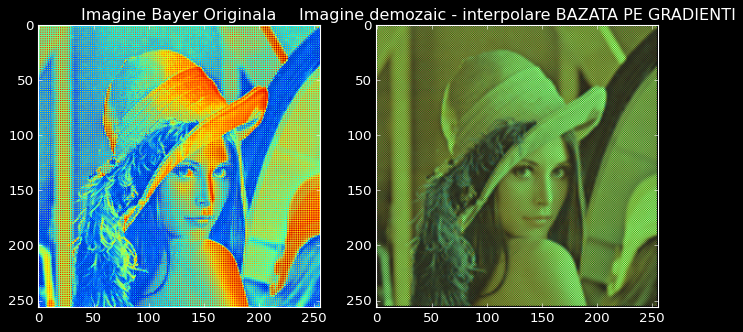

In [88]:
# DEMOZAICARE DUPA PROCEDURA DE INTERPOLARE BAZATA PE GRADIENTII ORIZONTALI SI VERTICALI
def demozaic_gradient_green(mozaic, T=64):
    """
    Demozaicarea planului verde folosind gradientii orizontali si verticali.

    :param mozaic: Imaginea Bayer input (grayscale matrix)
    :param T: Pragul fix pentru compararea gradientilor (implicit T=64)
    :return: Imaginea reconstruita (doar planul verde)
    """
    if np.max(mozaic) > 1:
        mozaic = mozaic / 255.0

    L, C = mozaic.shape
    green = np.zeros_like(mozaic)

    for l in range(1, L - 1):  # Evitam marginile
        for c in range(1, C - 1):
            G3, G7, G9, G13 = mozaic[l - 1, c], mozaic[l, c - 1], mozaic[l, c + 1], mozaic[l + 1, c]

            # Calcularea gradientilor
            delta_H = abs(G7 - G9)
            delta_V = abs(G3 - G13)

            # Calcularea valorii verzi in functie de gradienti
            if delta_H < T and delta_V > T:
                green[l, c] = (G3 + G13) / 2
            elif delta_H > T and delta_V < T:
                green[l, c] = (G7 + G9) / 2
            else:
                green[l, c] = (G3 + G7 + G9 + G13) / 4

    return green

def demozaic_gradient(mozaic, T=64):
    """
    Demozaicarea tuturor planurilor folosind gradientii orizontali si verticali.

    :param mozaic: Imaginea Bayer input (grayscale matrix)
    :param T: Pragul fix pentru compararea gradientilor (implicit T=64)
    :return: Imaginea reconstruita (RGB)
    """
    if np.max(mozaic) > 1:
        mozaic = mozaic / 255.0

    L, C = mozaic.shape
    rgb = np.zeros((L, C, 3))

    for l in range(1, L - 1):  # Evitam marginile
        for c in range(1, C - 1):
            G3, G7, G9, G13 = mozaic[l - 1, c], mozaic[l, c - 1], mozaic[l, c + 1], mozaic[l + 1, c]

            # Calcularea gradientilor
            delta_H = abs(G7 - G9)
            delta_V = abs(G3 - G13)

            # Pixel verde pe pozitiile verzi din tiparul Bayer
            if (l % 2 == 0 and c % 2 == 1) or (l % 2 == 1 and c % 2 == 0):
                if delta_H < T and delta_V > T:
                    rgb[l, c, 1] = (G3 + G13) / 2
                elif delta_H > T and delta_V < T:
                    rgb[l, c, 1] = (G7 + G9) / 2
                else:
                    rgb[l, c, 1] = (G3 + G7 + G9 + G13) / 4

            # Pixel rosu pe pozitiile rosii (colturi rosii ale tiparului Bayer)
            elif l % 2 == 0 and c % 2 == 0:
                rgb[l, c, 0] = mozaic[l, c]
                rgb[l, c, 1] = (G3 + G13 + G7 + G9) / 4  # Interpolare pentru verde
                rgb[l, c, 2] = (mozaic[l - 1, c - 1] + mozaic[l - 1, c + 1] + \
                                mozaic[l + 1, c - 1] + mozaic[l + 1, c + 1]) / 4

            # Pixel albastru pe pozitiile albastre (colturi albastre ale tiparului Bayer)
            elif l % 2 == 1 and c % 2 == 1:
                rgb[l, c, 2] = mozaic[l, c]
                rgb[l, c, 1] = (G3 + G13 + G7 + G9) / 4  # Interpolare pentru verde
                rgb[l, c, 0] = (mozaic[l - 1, c - 1] + mozaic[l - 1, c + 1] + \
                                mozaic[l + 1, c - 1] + mozaic[l + 1, c + 1]) / 4

            # Interpolare pentru pixelii care nu se potrivesc direct (margini si alte cazuri)
            else:
                if l % 2 == 0:  # Rând par
                    rgb[l, c, 0] = (mozaic[l, c - 1] + mozaic[l, c + 1]) / 2  # Interpolare pentru roșu
                    rgb[l, c, 2] = (mozaic[l - 1, c] + mozaic[l + 1, c]) / 2  # Interpolare pentru albastru
                else:  # Rând impar
                    rgb[l, c, 0] = (mozaic[l - 1, c] + mozaic[l + 1, c]) / 2  # Interpolare pentru roșu
                    rgb[l, c, 2] = (mozaic[l, c - 1] + mozaic[l, c + 1]) / 2  # Interpolare pentru albastru

    return rgb

img_mozaicare = rgb2bayer(img)
imgout = demozaic_gradient(img_mozaicare, T=64)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Imagine Bayer Originala")
plt.imshow(img_mozaicare)

plt.subplot(1, 2, 2)
plt.title("Imagine demozaic - interpolare BAZATA PE GRADIENTI")
plt.imshow(imgout)
plt.show()


163 217 255


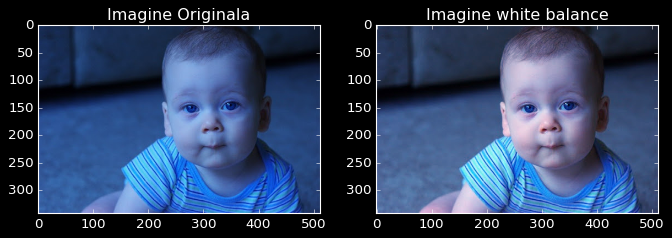

In [99]:
# lab 10
# white balance - metoda 1- corectia

def white_balance(img):
    imgout = img[:,:,0:3]/255.0 # lucram in [0,1]
    
    # gasim Rmax, Gmax, Bmax
    rmax = np.max(img[:,:,0])
    gmax = np.max(img[:,:,1])
    bmax = np.max(img[:,:,2])
    
    print(rmax, gmax, bmax)

    imgout[:,:,0] = img[:,:,0] / (rmax) # could be / 0
    imgout[:,:,1] = img[:,:,1] / (gmax)
    imgout[:,:,2] = img[:,:,2] / (bmax)
    
    return imgout

img = io.imread("baby.jpg")

img_white_balance = white_balance(img)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Imagine Originala")
plt.imshow(img)

plt.subplot(1, 2, 2)
plt.title("Imagine white balance - corectie")
plt.imshow(img_white_balance)
plt.show()

0.984313725490196 0.9725490196078431 0.8392156862745098


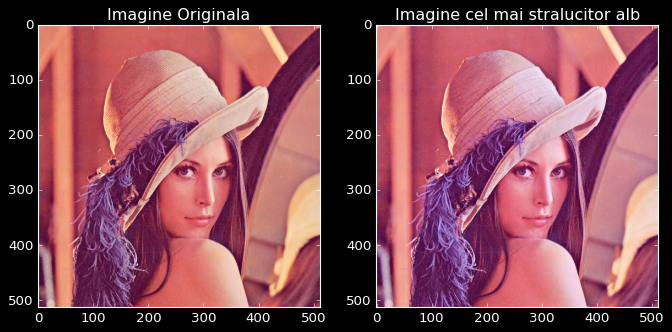

In [101]:
# white balance - metoda 2 - "cel mai stralucitor alb"

def cel_mai_stralucitor_alb(img):
    img = img[:,:,0:3]/255.0 
    img_ycbcr = color.rgb2ycbcr(img)
    Y = img_ycbcr[:,:,0]
    
    ind = np.unravel_index(np.argmax(Y,axis=None),Y.shape)
    Rmax = img[ind[0],ind[1],0]
    Gmax = img[ind[0],ind[1],1]
    Bmax = img[ind[0],ind[1],2]
    
    print(Rmax, Gmax, Bmax)
    
    img[:,:,0] = img[:,:,0] / (Rmax) # could be / 0
    img[:,:,1] = img[:,:,1] / (Gmax)
    img[:,:,2] = img[:,:,2] / (Bmax)
    
    return np.clip(img, min=0, max=1)

img = io.imread("lena.png")

img_white_balance = cel_mai_stralucitor_alb(img)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Imagine Originala")
plt.imshow(img)

plt.subplot(1, 2, 2)
plt.title("Imagine cel mai stralucitor alb")
plt.imshow(img_white_balance)
plt.show()
    

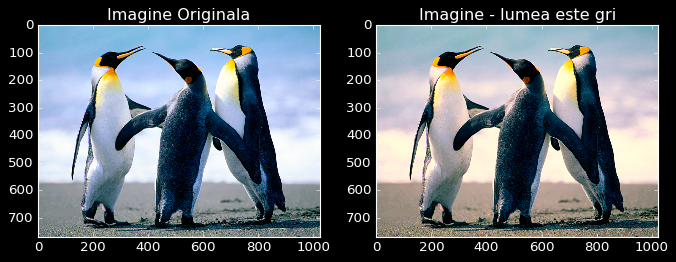

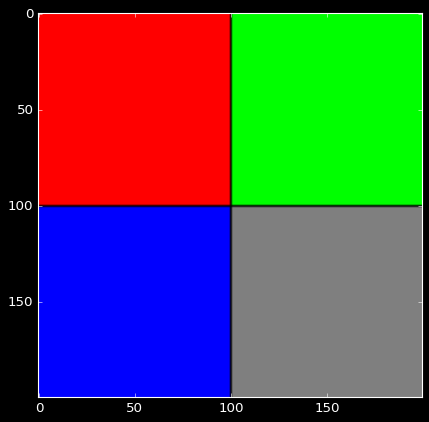

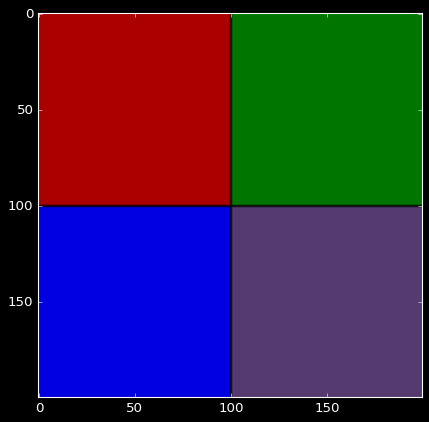

63.327125 43.16895 82.637775


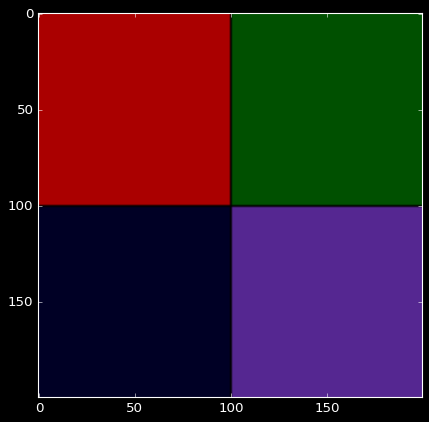

(<Figure size 640x480 with 1 Axes>,
 None)

In [110]:
# white balance - metoda 3 - "lumea este gri"

def lumea_este_gri(img):
    if np.max(img) > 1:
        img = img / 255.0  # Normalizare în intervalul [0, 1]

    # Calculul mediilor pentru fiecare canal R, G, B
    Rm = np.mean(img[:, :, 0])
    Gm = np.mean(img[:, :, 1])
    Bm = np.mean(img[:, :, 2])
    
    # print(Rm, Gm, Bm)

    # Intensitatea medie globală
    Im = (Rm + Gm + Bm) / 3

    # Factori de corecție pentru fiecare canal
    kR = Rm / Im
    kG = Gm / Im
    kB = Bm / Im

    # Aplicarea corecției pe fiecare canal
    img[:, :, 0] = img[:, :, 0] / kR
    img[:, :, 1] = img[:, :, 1] / kG
    img[:, :, 2] = img[:, :, 2] / kB

    # Clipăm valorile pentru a rămâne în intervalul [0, 1]
    img_balanced = np.clip(img, 0, 1)
    return img_balanced

    
img = io.imread("Penguins.jpg")
 
img_white_balance = lumea_este_gri(img)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Imagine Originala")
plt.imshow(img)

plt.subplot(1, 2, 2)
plt.title("Imagine - lumea este gri")
plt.imshow(img_white_balance)
plt.show()

########################################
# aplicarea metodei pe o img artificiala
# rezultat: Demonstrează cum metoda funcționează și în cazuri controlate, cu valori clare pentru canalele de culoare.

# crearea img artificiale
img2 = np.zeros((200,200,3), dtype=np.uint8)

L,C,_ = np.shape(img2)

img2[0:L//2,0:C//2]     = [255,0,0] # rosu in colt stanga sus
img2[L//2+1:L,0:C//2]   = [0,0,255] # albastru in colt stanga jos

img2[0:L//2,C//2+1:C]   = [0,255,0] # verde in colt dreapta sus
img2[L//2+1:L,C//2+1:C] = [255//2,255//2,255//2] # gri in colt dreapta jos

plt.figure(), plt.imshow(img2), plt.show()

# aplicarrea unei ponderari initiale
img2[:,:,0] = img2[:,:,0]*0.67
img2[:,:,1] = img2[:,:,1]*0.46
img2[:,:,2] = img2[:,:,2]*0.88

plt.figure(), plt.imshow(img2), plt.show()

L,C,pl = np.shape(img2)

# calculul mediilor si ajustarea balansului
Rm = np.mean(img2[:,:,0])
Gm = np.mean(img2[:,:,1])
Bm = np.mean(img2[:,:,2])

print(Rm, Gm, Bm)

Im = (Rm+Gm+Bm)/3

kR = Rm/Im
kG = Gm/Im
kB = Bm/Im

img2[:,:,0] = img2[:,:,0] * kR
img2[:,:,1] = img2[:,:,1] * kG
img2[:,:,2] = img2[:,:,2] * kB

plt.figure(), plt.imshow(img2), plt.show()

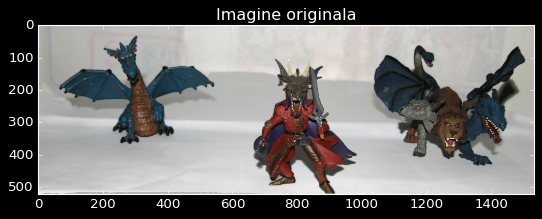

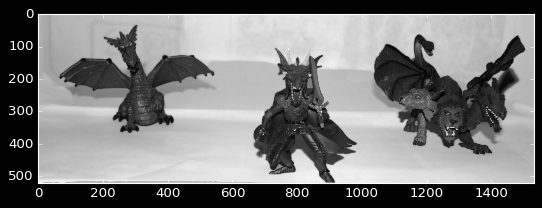

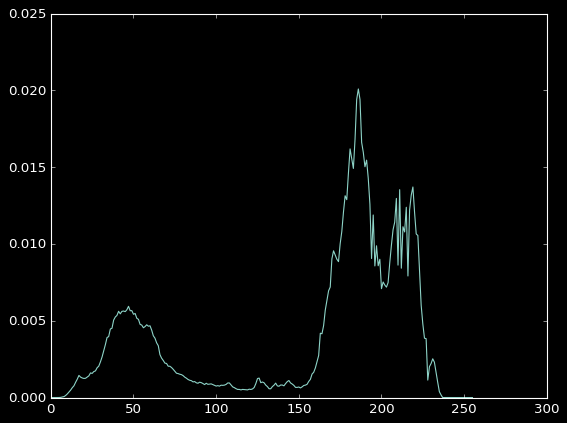

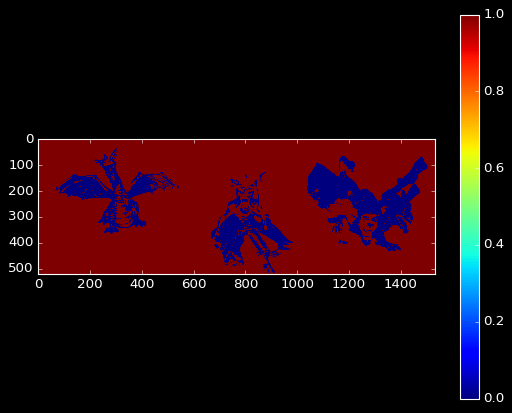

In [115]:
# SEGMENTARE PE PRAG CU HISTOGRAMA
plt.style.use('dark_background')

def segmentare_pe_prag(img):
    Y = np.uint8(255*color.rgb2gray(img))
    plt.figure(), plt.imshow(Y, cmap='gray'), plt.show()
    
    hist,_ = np.histogram(Y,bins=256,range=(0,256))
    hist = hist/np.sum(hist)
    plt.figure(), plt.plot(hist), plt.show()
    
    plt.figure(), plt.imshow(Y > 120, interpolation = None), plt.colorbar(), plt.show()
    # valorile px sunt identificatori de clase => nu imi trebuie cmap gri

    # albastrul care apare e legat de afisare -> a aparut fenomenul de aliere (zone de albastru, imaginea nu e binarizata)
    # tb dezactivat dithering-ul la afisare => interpolation = none -> nu merge => incercam altceva: Y[0:300, 0:200] > 120
    
    # 1 px de ecran != 1 px de poza => pe 1 px de ecran erau mai multi px de poza => aparea aliere
    
    # prag prea sus (170) => apar si px din fundal in forme
    
    # prag prea jos (60) => lipsesc px din obiecte

img=io.imread('poza1.jpg')
plt.figure(), plt.imshow(img), plt.title("Imagine originala"), plt.show()
segmentare_pe_prag(img)


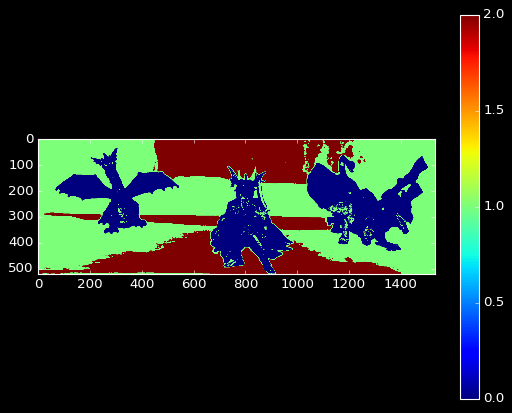

(<Figure size 640x480 with 2 Axes>,
 None)

In [120]:
# segmentarea pe planul de luminozitate cu mai multe praguri

def segmentare_pe_praguri(img, T1, T2):
    Y = np.uint8(255*color.rgb2gray(img))
    [Linii, Coloane] = np.shape(Y)
    out = np.zeros((Linii, Coloane))
    
    for l in range (0, Linii):
        for c in range (0, Coloane):
            # operatie punctuala => nu trebuie sa bordez
            
            if Y[l,c] > T2: # al doilea prag
                out[l,c] = 2
            else:
                if Y[l,c] > T1: # primul prag (cel inferior)
                    out[l,c] = 1
                    #al treilea prag este deja facut, pt ca imag este intializata cu 0-uri
                    
    return out
   
img=io.imread('poza1.jpg')

# T1 = 100
# T2 = 200
out = segmentare_pe_praguri(img, 100, 200)             

plt.figure(), plt.imshow(out, interpolation = None), plt.colorbar(), plt.show()

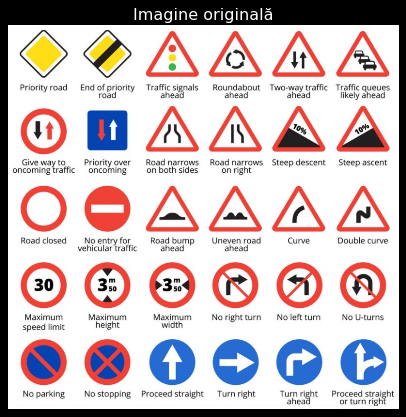

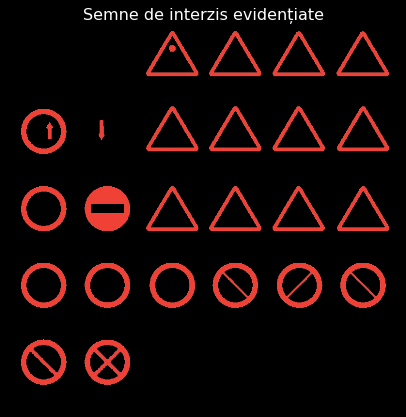

In [122]:
# Separati semnele de interzis din imaginea semnecirculatie.jpg
import numpy as np
import matplotlib.pyplot as plt
from skimage import io

# Funcție pentru separarea semnelor de interzis
def extract_forbidden_signs(image_path):
    # Încărcăm imaginea
    img = io.imread(image_path)

    # Afișăm imaginea originală
    plt.figure()
    plt.imshow(img)
    plt.title("Imagine originală")
    plt.axis("off")
    plt.show()

    # Separăm planurile de culoare
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    # Creăm o mască pentru a identifica zonele de culoare roșie
    # Pragurile sunt stabilite pentru a detecta specificitatea culorii roșii din semne
    red_mask = (R > 150) & (G < 100) & (B < 100)

    # Aplicăm masca pe imagine pentru a evidenția semnele de interzis
    forbidden_signs = np.zeros_like(img)
    forbidden_signs[red_mask] = img[red_mask]

    # Afișăm rezultatul
    plt.figure()
    plt.imshow(forbidden_signs)
    plt.title("Semne de interzis evidențiate")
    plt.axis("off")
    plt.show()

# Apelăm funcția pentru imaginea 'semnecirculatie.jpg'
extract_forbidden_signs('semnecirculatie.jpg')

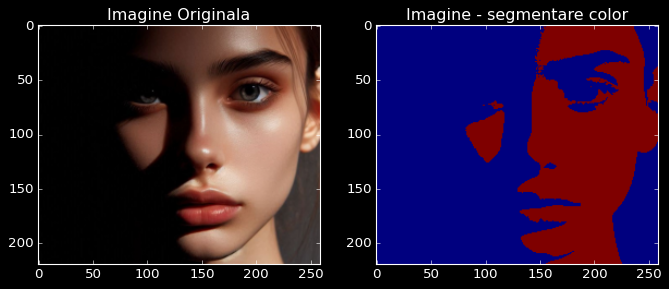

In [126]:
# SEGMENTARE CU PRAG PE O IMAGINE NATURALA COLOR

def segmentare_color(img):
    L,C,pl = np.shape(img)
    imgout = np.zeros((L,C))
    
    for l in range(L):
        for c in range(C):
            if img[l,c,0] > 95 and img[l,c,1] > 40 and img[l,c,2] > 20:
                imgout[l,c]=1
                
    return imgout

img = io.imread('uneven-face-mic.png')
imgout = segmentare_color(img)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Imagine Originala")
plt.imshow(img)

plt.subplot(1, 2, 2)
plt.title("Imagine - segmentare color")
plt.imshow(imgout)
plt.show()
# sau

# img = img[:,:,0:3]
# T = np.zeros((1,1,3))
# T[0,0,0] = 95
# T[0,0,1] = 40
# T[0,0,2] = 20
# 
# imgout = img > T
# plt.figure(), plt.imshow(np.prod(np.float64(imgout), axis = 2)), plt.colorbar(), plt.show() # facem produs ca sa avem doar 0 si 1
# # by default produsul va fi 0, daca conditia e adevarata pt un plan sau 2 planuri, atunci produsul va fi 1

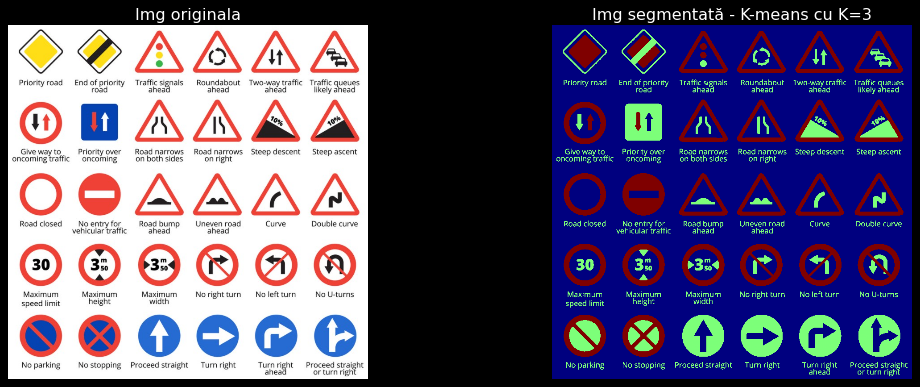

In [143]:
# Funcție pentru aplicarea K-means kmeans pe imagine

import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color
from scipy import signal
from sklearn import cluster

def kmeans_segmentation(img, K):
    if np.max(img) > 1:
        img = img / 255.0  # Normalizare în intervalul [0, 1]

    # Dimensiuni imagine
    dims = img.shape

    # Separăm canalele de culoare și le vectorizăm
    R = img[:, :, 0].flatten()
    G = img[:, :, 1].flatten()
    B = img[:, :, 2].flatten()

    # Creăm setul de date pentru K-means
    data = np.vstack((R, G, B)).T

    # Aplicăm K-means clustering
    kmeans = cluster.KMeans(n_clusters=K, random_state=42).fit(data)
    labels = kmeans.labels_

    # Reshape la dimensiunea inițială
    segmented_img = labels.reshape(dims[0], dims[1])

    return segmented_img

# Imagine de test
img = io.imread('semnecirculatie.jpg')
img = img[:, :, :3]  # Eliminăm canalul alfa, dacă există

# Segmentarea folosind K-means
K = 3
segmented_kmeans = kmeans_segmentation(img, K)

# Afișarea imaginii originale și a celei segmentate
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(img)
axs[0].set_title("Img originala")
axs[0].axis("off")

axs[1].imshow(segmented_kmeans, cmap='jet')
axs[1].set_title(f"Img segmentată - K-means cu K={K}")
axs[1].axis("off")

plt.tight_layout()
plt.show()

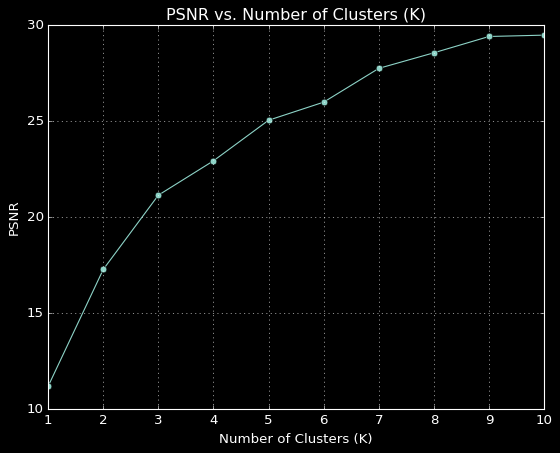

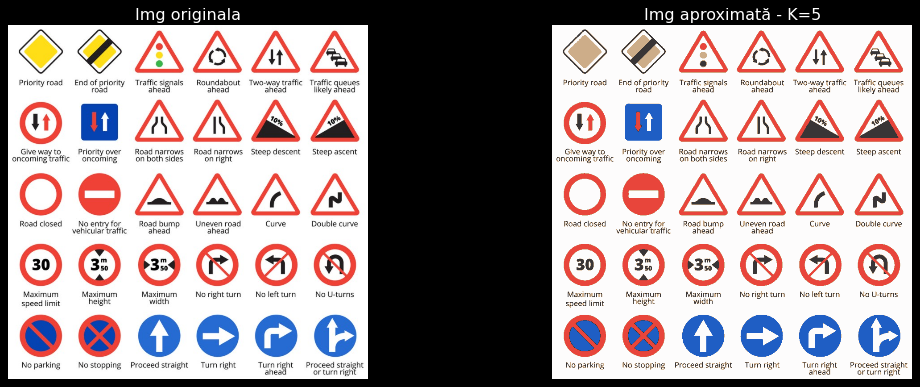

In [144]:
# Sa se genereze o imagine color care aproximeaza imaginea coor intiala, inlocuind culoarea fiecarui pixel original cu centroidul clasei la care acest pixel apartine conform unui clustering cu K clase. Sa se reprezinte grafic calitatea imaginii color aproximate din centroizi in functie de numarul de K clase.

import matplotlib.pyplot as plt
from skimage import io

# Funcție pentru generarea imaginii color aproximative bazată pe clustering K-means
def kmeans_color_approximation(img, max_k):
    if np.max(img) > 1:
        img = img / 255.0  # Normalizare în intervalul [0, 1]

    # Dimensiuni imagine
    dims = img.shape

    # Separăm canalele de culoare și le vectorizăm
    R = img[:, :, 0].flatten()
    G = img[:, :, 1].flatten()
    B = img[:, :, 2].flatten()

    # Creăm setul de date pentru K-means
    data = np.vstack((R, G, B)).T

    # Inițializare listă pentru stocarea erorilor și imaginii aproximative
    psnr_values = []
    approx_images = []

    # Iterăm prin valorile K
    for K in range(1, max_k + 1):
        # Aplicăm K-means clustering
        kmeans = cluster.KMeans(n_clusters=K, random_state=0).fit(data)
        labels = kmeans.labels_
        centroids = kmeans.cluster_centers_

        # Construim imaginea aproximativă din centroizi
        approx_img = centroids[labels].reshape(dims)
        approx_images.append(approx_img)

        # Calculăm PSNR între imaginea originală și cea aproximativă
        mse = np.mean((img - approx_img) ** 2)
        psnr = 10 * np.log10(1 / mse) if mse > 0 else float('inf')
        psnr_values.append(psnr)

    # Reprezentăm grafic PSNR în funcție de K
    plt.figure()
    plt.plot(range(1, max_k + 1), psnr_values, marker='o')
    plt.title("PSNR vs. Number of Clusters (K)")
    plt.xlabel("Number of Clusters (K)")
    plt.ylabel("PSNR")
    plt.grid()
    plt.show()

    return approx_images, psnr_values

# Imagine de test
img = io.imread('semnecirculatie.jpg')
img = img[:, :, :3]  # Eliminăm canalul alfa, dacă există

# Generarea imaginilor aproximative și reprezentarea PSNR
max_k = 10
approx_images, psnr_values = kmeans_color_approximation(img, max_k)

# Afișarea imaginii originale și a unei imagini aproximative pentru o valoare specifică a lui K
K_to_display = 5
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(img)
axs[0].set_title("Img originala")
axs[0].axis("off")

axs[1].imshow(approx_images[K_to_display - 1])
axs[1].set_title(f"Img aproximată - K={K_to_display}")
axs[1].axis("off")

plt.tight_layout()
plt.show()

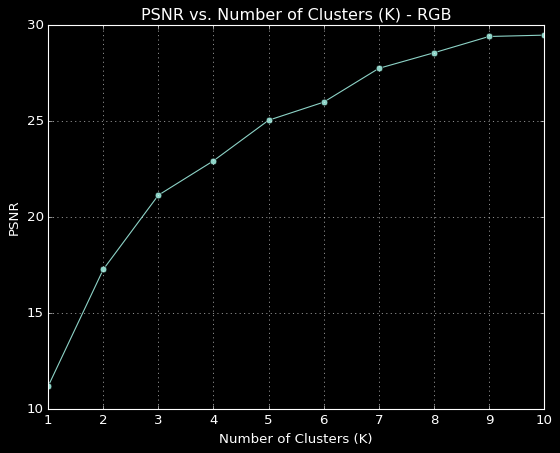

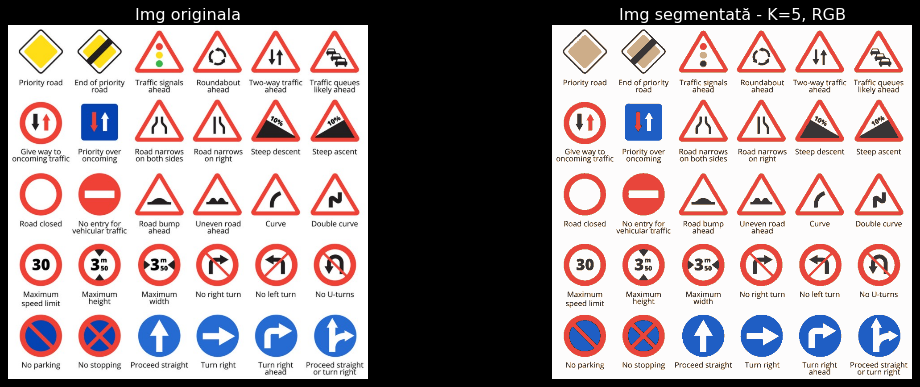

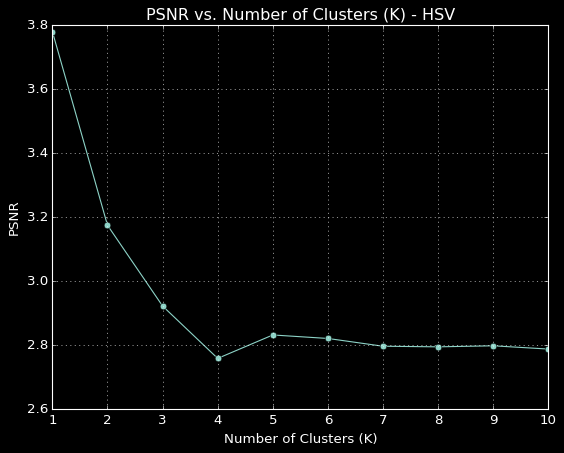

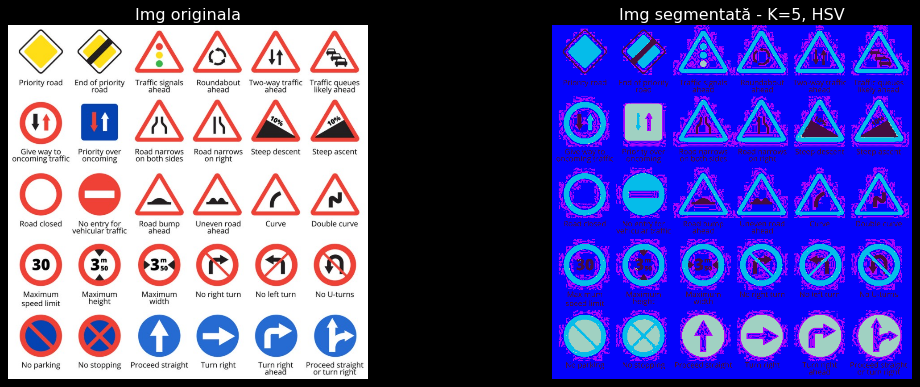

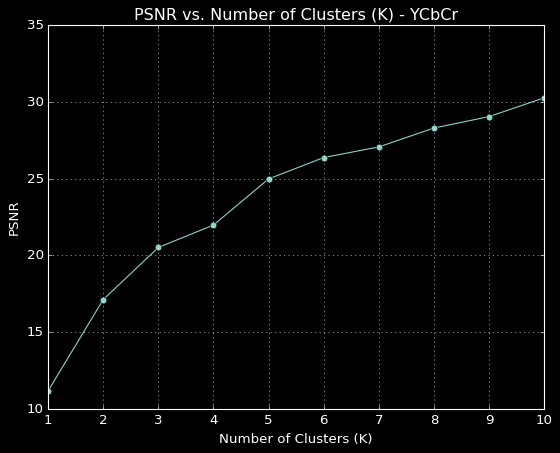

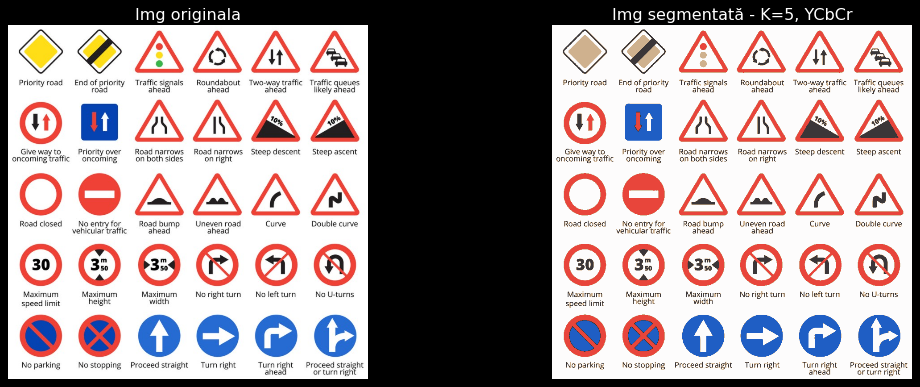

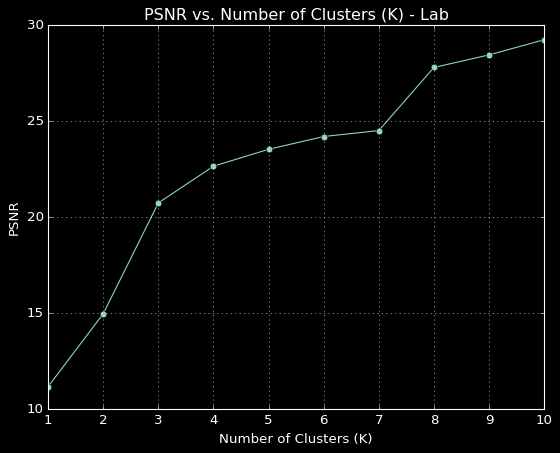

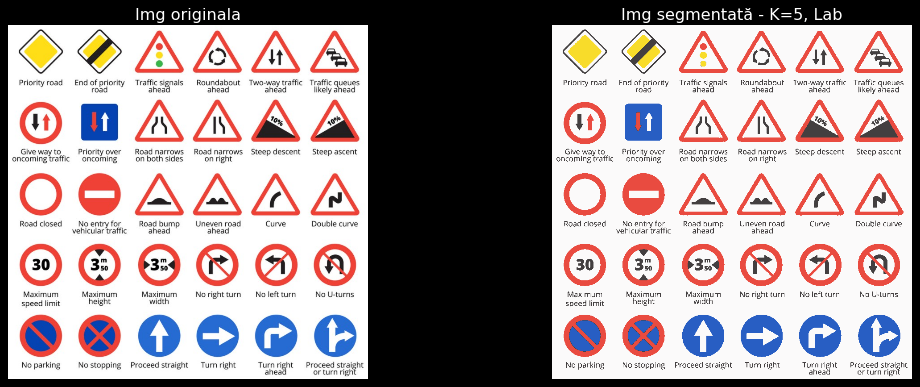

In [145]:
# Funcție pentru segmentarea prin clustering în diferite spații de culoare

import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color
from sklearn import cluster


def kmeans_segmentation_in_color_space(img, max_k, color_space='RGB'):
    if np.max(img) > 1:
        img = img / 255.0  # Normalizare în intervalul [0, 1]

    # Conversia imaginii în spațiul de culoare specificat
    if color_space == 'HSV':
        img_converted = color.rgb2hsv(img)
    elif color_space == 'YCbCr':
        img_converted = color.rgb2ycbcr(img)
    elif color_space == 'Lab':
        img_converted = color.rgb2lab(img)
    else:  # Implicit RGB
        img_converted = img

    # Dimensiuni imagine
    dims = img_converted.shape

    # Separăm canalele de culoare și le vectorizăm
    channels = [img_converted[:, :, i].flatten() for i in range(dims[2])]

    # Creăm setul de date pentru K-means
    data = np.vstack(channels).T

    # Inițializare listă pentru stocarea erorilor și imaginii segmentate
    psnr_values = []
    segmented_images = []

    # Iterăm prin valorile K
    for K in range(1, max_k + 1):
        # Aplicăm K-means clustering
        kmeans = cluster.KMeans(n_clusters=K, random_state=0).fit(data)
        labels = kmeans.labels_
        centroids = kmeans.cluster_centers_

        # Construim imaginea segmentată din centroizi
        segmented_img = centroids[labels].reshape(dims)

        # Asigurare că valorile sunt în intervalul [0, 1] pentru afișare
        if color_space in ['RGB', 'HSV']:
            segmented_img = np.clip(segmented_img, 0, 1)
        elif color_space in ['Lab', 'YCbCr']:
            segmented_img = np.clip(color.lab2rgb(segmented_img) if color_space == 'Lab' else color.ycbcr2rgb(segmented_img), 0, 1)

        segmented_images.append(segmented_img)

        # Calculăm PSNR între imaginea originală și cea segmentată
        mse = np.mean((img - segmented_img) ** 2)
        psnr = 10 * np.log10(1 / mse) if mse > 0 else float('inf')
        psnr_values.append(psnr)

    # Reprezentăm grafic PSNR în funcție de K
    plt.figure()
    plt.plot(range(1, max_k + 1), psnr_values, marker='o')
    plt.title(f"PSNR vs. Number of Clusters (K) - {color_space}")
    plt.xlabel("Number of Clusters (K)")
    plt.ylabel("PSNR")
    plt.grid()
    plt.show()

    return segmented_images, psnr_values

# Imagine de test
img = io.imread('semnecirculatie.jpg')
img = img[:, :, :3]  # Eliminăm canalul alfa, dacă există

# Generarea imaginilor segmentate în diferite spații de culoare
max_k = 10
color_spaces = ['RGB', 'HSV', 'YCbCr', 'Lab']

for space in color_spaces:
    segmented_images, psnr_values = kmeans_segmentation_in_color_space(img, max_k, color_space=space)

    # Afișarea imaginii originale și a uneia segmentate pentru o valoare specifică a lui K
    K_to_display = 5
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))

    axs[0].imshow(img)
    axs[0].set_title("Img originala")
    axs[0].axis("off")

    axs[1].imshow(segmented_images[K_to_display - 1])
    axs[1].set_title(f"Img segmentată - K={K_to_display}, {space}")
    axs[1].axis("off")

    plt.tight_layout()
    plt.show()

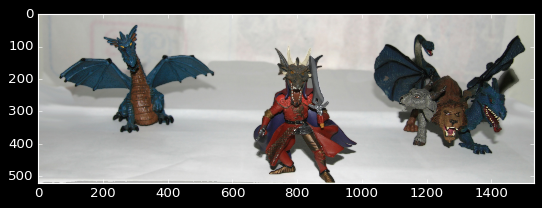

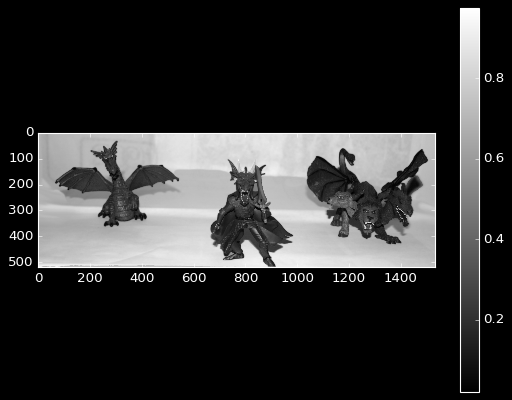

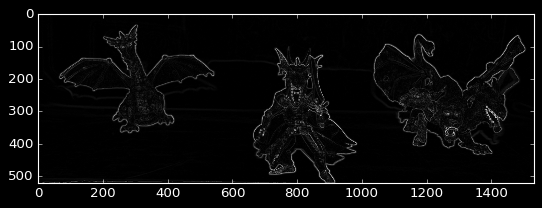

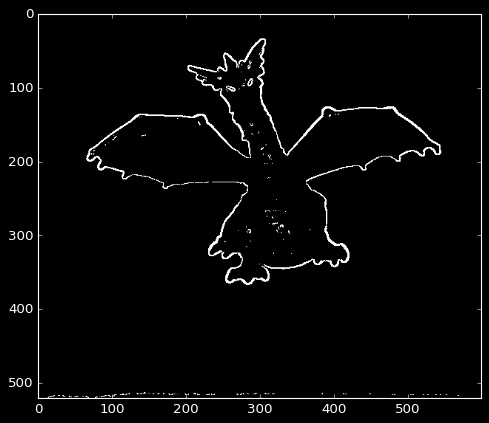

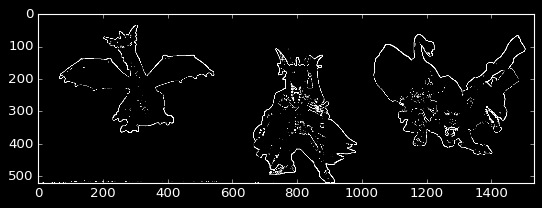

(<Figure size 640x480 with 1 Axes>,
 None)

In [152]:
#lab 12
# extragerea contururilor - nucleu - GRADIENT CLASIC

import numpy as np
from skimage import io,color
import matplotlib.pyplot as plt
from scipy import signal

def contur_gradient_clasic(img):
    Y = color.rgb2gray(img)
    plt.figure(), plt.imshow(Y, cmap='gray'),plt.colorbar(), plt.show()
    
    kernelH=np.zeros((3,3))
    kernelH[1,0]=-1
    kernelH[1,2]=1
    kernelV=np.zeros((3,3))
    kernelV[0,1]=-1
    kernelV[2,1]=1
    YH = signal.convolve2d(Y, kernelV, mode='same', boundary='symm')
    YV = signal.convolve2d(Y, kernelH, mode='same', boundary='symm')
    
    contur_map=np.abs(YH)+np.abs(YV)
    
    return contur_map

def contur_sobel(img):
    Y = color.rgb2gray(img)
    plt.figure(), plt.imshow(Y, cmap='gray'),plt.colorbar(), plt.show()
    
    # Kernel Sobel orizontal
    kernelH = np.array([
        [-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1]
    ])
    # Kernel Sobel vertical
    kernelV = np.array([
        [-1, -2, -1],
        [ 0,  0,  0],
        [ 1,  2,  1]
    ])
    YH = signal.convolve2d(Y, kernelV, mode='same', boundary='symm')
    YV = signal.convolve2d(Y, kernelH, mode='same', boundary='symm')
    
    contur_map = np.sqrt(YH**2 + YV**2)
    
    return contur_map

def contur_prewitt(img):
    Y = color.rgb2gray(img)
    plt.figure(), plt.imshow(Y, cmap='gray'),plt.colorbar(), plt.show()
    
    # Kernel Prewitt orizontal
    kernelH = np.array([
        [-1, 0, 1],
        [-1, 0, 1],
        [-1, 0, 1]
    ])

    # Kernel Prewitt vertical
    kernelV = np.array([
        [-1, -1, -1],
        [ 0,  0,  0],
        [ 1,  1,  1]
    ])
    YH = signal.convolve2d(Y, kernelV, mode='same', boundary='symm')
    YV = signal.convolve2d(Y, kernelH, mode='same', boundary='symm')
    
    contur_map = np.abs(YH) + np.abs(YV)
    
    return contur_map


img=io.imread('poza1.jpg')
plt.figure(), plt.imshow(img), plt.show()
contur_map = contur_gradient_clasic(img)

# plt.figure(), plt.imshow(contur_map[:,0:600], cmap='gray'), plt.show()
plt.figure(), plt.imshow(contur_map, cmap='gray'), plt.show()

plt.figure(), plt.imshow(contur_map[:,0:600]>=0.2, cmap='gray'), plt.show()
plt.figure(), plt.imshow(contur_map>=0.2, cmap='gray'), plt.show()

plt.figure(), plt.imshow(contur_map[:, 0:599] >= 0.6, cmap = 'gray'), plt.colorbar(), plt.show()  # testat si pt 0.5 si 0.4 si din ce in ce mai jos pana se vad bine contururile
# 0.6 pt ca am 3 sume acum => echivalentul a 0.2 de dinainte de la cel cu matricea:
#  0  0  0
# -1  0  1
#  0  0  0


# si acum e
# -1 0 1
# -1 0 1
# -1 0 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.4725490196078432].


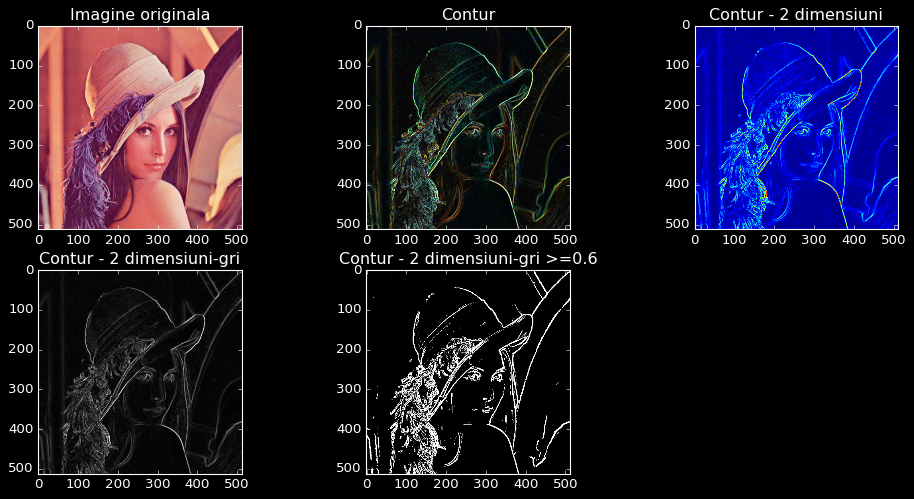

In [157]:
# GRADIENT NETEZIT - imagini color
img = io.imread('lena.png')
plt.figure(figsize=(15, 7))
plt.subplot(2, 3, 1)
plt.imshow(img)
plt.title("Imagine originala")

YH, YV = np.zeros(np.shape(img)), np.zeros(np.shape(img))

kernelH=np.zeros((3,3))
kernelV=np.zeros((3,3))
kernelH = [[-1,0,1],[-1,0,1],[-1,0,1]]
kernelV = [[-1,-1,-1],[0,0,0],[1,1,1]]

for plan in range(0,3): # (-255,255)
    YH[:,:,plan] = signal.convolve2d(img[:,:,plan], kernelV, mode='same', boundary='symm')
    YV[:,:,plan] = signal.convolve2d(img[:,:,plan], kernelH, mode='same', boundary='symm')

contur_map=(np.abs(YH/255.0)+np.abs(YV/255.0))/2.0   # normam la valori 0,255 (float in 0,1 sau int in 0,255)
plt.subplot(2, 3, 2)
plt.imshow(contur_map)
plt.title("Contur")

contur_map_2dim = np.sum(contur_map, axis=2)
plt.subplot(2, 3, 3)
plt.imshow(contur_map_2dim)
plt.title("Contur - 2 dimensiuni")

plt.subplot(2, 3, 4)
plt.imshow(contur_map_2dim, cmap='gray')
plt.title("Contur - 2 dimensiuni-gri")

plt.subplot(2, 3, 5)
plt.imshow(contur_map_2dim>=0.6, cmap='gray')
plt.title("Contur - 2 dimensiuni-gri >=0.6")

plt.show()